## Understanding SAE Features with the Logit Lens

This notebook demonstrates how to use the mats_sae_training library to perform the analysis documented the post "[Understanding SAE Features with the Logit Lens](https://www.alignmentforum.org/posts/qykrYY6rXXM7EEs8Q/understanding-sae-features-with-the-logit-lens)".

As such, the notebook will include sections for:
- Loading in GPT2-Small Residual Stream SAEs from Huggingface.
- Performing Virtual Weight Based Analysis of features (specifically looking at the logit weight distributions).
- Programmatically opening neuronpedia tabs to engage with public dashboards on [neuronpedia](https://www.neuronpedia.org/).
- Performing Token Set Enrichment Analysis (based on Gene Set Enrichment Analysis).

### Set Up

Here we'll load various functions for things like:
- downloading and loading our SAEs from huggingface.
- opening neuronpedia from a jupyter cell.
- calculating statistics of the logit weight distributions.
- performing Token Set Enrichment Analysis (TSEA) and plotting the results.

#### Imports

In [1]:
import numpy as np
import torch
import plotly_express as px

from transformer_lens import HookedTransformer

# Model Loading
from sae_lens import SAE
from sae_lens.analysis.neuronpedia_integration import get_neuronpedia_quick_list

# Virtual Weight / Feature Statistics Functions
from sae_lens.analysis.feature_statistics import (
    get_all_stats_dfs,
    get_W_U_W_dec_stats_df,
)

# Enrichment Analysis Functions
from sae_lens.analysis.tsea import (
    get_enrichment_df,
    manhattan_plot_enrichment_scores,
    plot_top_k_feature_projections_by_token_and_category,
)

from sae_lens.analysis.tsea import (
    get_baby_name_sets,
    get_letter_gene_sets,
    generate_pos_sets,
    get_test_gene_sets,
    get_gene_set_from_regex,
)

/Users/shiyang/miniconda3/envs/llm/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


The user_configs_dirpath doesn't exist. Making it: /Users/shiyang/.py2store_configs
The myconfigs_dirpath doesn't exist. Making it: /Users/shiyang/.py2store_configs/my


#### Loading GPT2 Small and SAE Weights

This will take a while the first time you run it, but will be quick thereafter.

In [2]:
model = HookedTransformer.from_pretrained("gpt2-small")
# this is an outdated way to load the SAE. We need to have feature spartisity loadable through the new interface to remove it.
gpt2_small_sparse_autoencoders = {}
gpt2_small_sae_sparsities = {}

for layer in range(12):
    sae, original_cfg_dict, sparsity = SAE.from_pretrained(
        release="gpt2-small-res-jb",
        sae_id="blocks.0.hook_resid_pre",
        device="cpu",
    )
    gpt2_small_sparse_autoencoders[f"blocks.{layer}.hook_resid_pre"] = sae
    gpt2_small_sae_sparsities[f"blocks.{layer}.hook_resid_pre"] = sparsity


/Users/shiyang/miniconda3/envs/llm/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Loaded pretrained model gpt2-small into HookedTransformer


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
/Users/shiyang/miniconda3/envs/llm/lib/python3.10/site-packages/sae_lens/sae.py:136: UserWarning: 
This SAE has non-empty model_from_pretrained_kwargs. 
For optimal performance, load the model like so:
model = HookedSAETransformer.from_pretrained_no_processing(..., **cfg.model_from_pretrained_kwargs)
  warnings.warn(


### Statistical Properties of Feature Logit Distributions

In the post I study layer 8 (for no particular reason). At the end of this notebook is code for visualizing these statistics across all layers. Feel free to change the layer here and explore different layers.

In [3]:
# In the post, I focus on layer 8
layer = 8

# get the corresponding SAE and feature sparsities.
sparse_autoencoder = gpt2_small_sparse_autoencoders[f"blocks.{layer}.hook_resid_pre"]
log_feature_sparsity = gpt2_small_sae_sparsities[f"blocks.{layer}.hook_resid_pre"].cpu()

W_dec = sparse_autoencoder.W_dec.detach().cpu()

# calculate the statistics of the logit weight distributions
W_U_stats_df_dec, dec_projection_onto_W_U = get_W_U_W_dec_stats_df(
    W_dec, model, cosine_sim=False
)
W_U_stats_df_dec["sparsity"] = (
    log_feature_sparsity  # add feature sparsity since it is often interesting.
)
display(W_U_stats_df_dec)

,feature,mean,std,skewness,kurtosis,sparsity
0,0,1.707836e-10,0.189715,0.764197,9.097904,-3.760490
1,1,-8.804840e-09,0.166483,0.083962,3.300045,-10.000000
2,2,-7.590380e-11,0.203762,0.698958,6.764231,-3.327929
3,3,1.973499e-09,0.189168,0.627483,8.012758,-3.775403
4,4,-1.525666e-08,0.234610,1.676332,10.387130,-3.804149
...,...,...,...,...,...,...
24571,24571,1.785162e-08,0.164352,0.128330,3.678063,-4.767260
24572,24572,6.527727e-09,0.185225,0.987419,12.197604,-3.828456
24573,24573,-5.497333e-08,0.160370,0.087656,3.220747,-10.000000
24574,24574,-1.910878e-08,0.161196,0.014309,3.154507,-10.000000


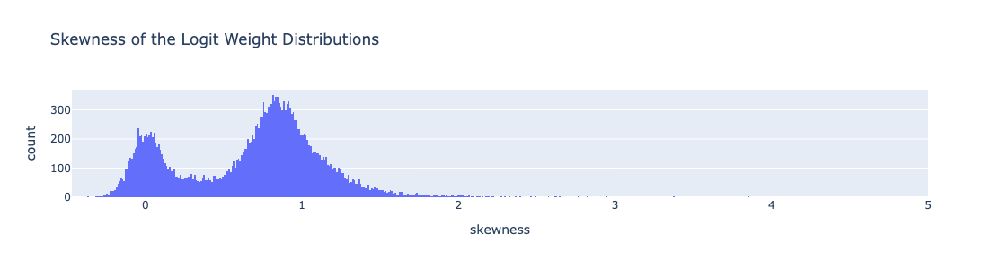

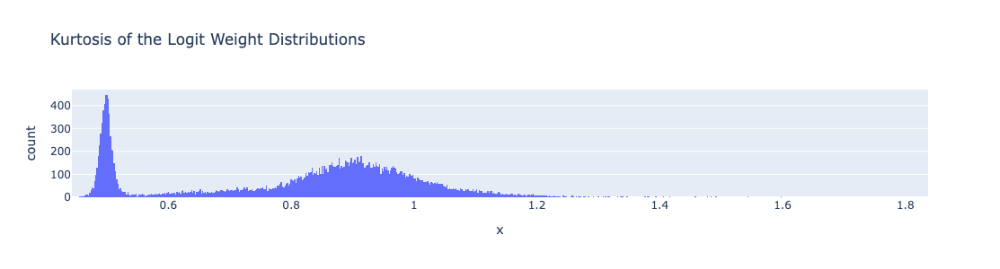

In [4]:
# Let's look at the distribution of the 3rd / 4th moments. I found these aren't as useful on their own as joint distributions can be.
px.histogram(
    W_U_stats_df_dec,
    x="skewness",
    width=800,
    height=300,
    nbins=1000,
    title="Skewness of the Logit Weight Distributions",
).show()

px.histogram(
    W_U_stats_df_dec,
    x=np.log10(W_U_stats_df_dec["kurtosis"]),
    width=800,
    height=300,
    nbins=1000,
    title="Kurtosis of the Logit Weight Distributions",
).show()

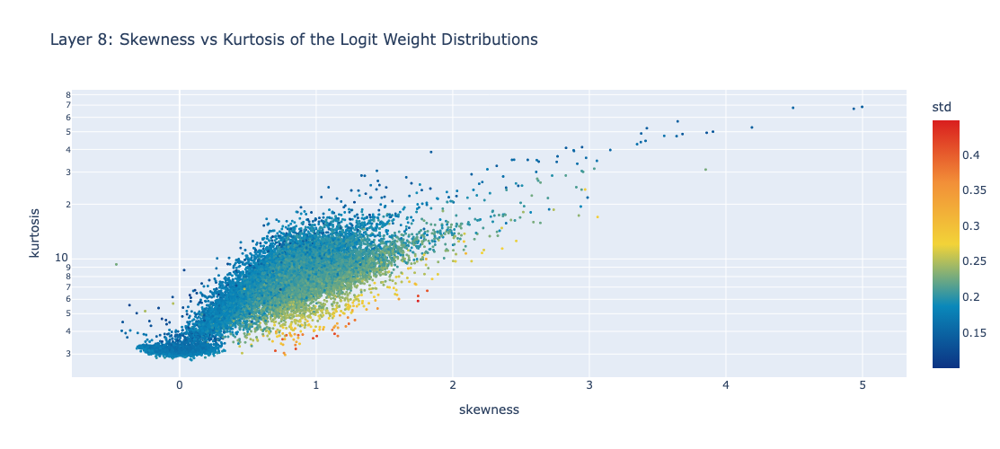

In [5]:
fig = px.scatter(
    W_U_stats_df_dec,
    x="skewness",
    y="kurtosis",
    color="std",
    color_continuous_scale="Portland",
    hover_name="feature",
    width=800,
    height=500,
    log_y=True,  # Kurtosis has larger outliers so logging creates a nicer scale.
    labels={"x": "Skewness", "y": "Kurtosis", "color": "Standard Deviation"},
    title=f"Layer {8}: Skewness vs Kurtosis of the Logit Weight Distributions",
)

# decrease point size
fig.update_traces(marker=dict(size=3))


fig.show()

In [6]:
# then you can query accross combinations of the statistics to find features of interest and open them in neuronpedia.
tmp_df = W_U_stats_df_dec[["feature", "skewness", "kurtosis", "std"]]
# tmp_df = tmp_df[(tmp_df["std"] > 0.04)]
# tmp_df = tmp_df[(tmp_df["skewness"] > 0.65)]
tmp_df = tmp_df[(tmp_df["skewness"] > 3)]
tmp_df = tmp_df.sort_values("skewness", ascending=False).head(10)
display(tmp_df)

# if desired, open the features in neuronpedia
get_neuronpedia_quick_list(sparse_autoencoder, list(tmp_df.feature))

,feature,skewness,kurtosis,std
21461,21461,4.997024,68.520081,0.147476
2243,2243,4.935741,66.889099,0.145082
23720,23720,4.491527,67.694031,0.153658
419,419,4.189990,52.835129,0.145135
18710,18710,3.905094,50.059898,0.139519
14941,14941,3.859168,49.382668,0.134501
21407,21407,3.851373,30.988359,0.228910
10615,10615,3.682019,48.561256,0.138532
10442,10442,3.646616,57.019695,0.145679
18654,18654,3.638962,47.288055,0.157968


python(2311) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


'https://neuronpedia.org/quick-list/?name=temporary_list&features=%5B%7B%22modelId%22%3A%20%22gpt2-small%22%2C%20%22layer%22%3A%20%220-res-jb%22%2C%20%22index%22%3A%20%2221461%22%7D%2C%20%7B%22modelId%22%3A%20%22gpt2-small%22%2C%20%22layer%22%3A%20%220-res-jb%22%2C%20%22index%22%3A%20%222243%22%7D%2C%20%7B%22modelId%22%3A%20%22gpt2-small%22%2C%20%22layer%22%3A%20%220-res-jb%22%2C%20%22index%22%3A%20%2223720%22%7D%2C%20%7B%22modelId%22%3A%20%22gpt2-small%22%2C%20%22layer%22%3A%20%220-res-jb%22%2C%20%22index%22%3A%20%22419%22%7D%2C%20%7B%22modelId%22%3A%20%22gpt2-small%22%2C%20%22layer%22%3A%20%220-res-jb%22%2C%20%22index%22%3A%20%2218710%22%7D%2C%20%7B%22modelId%22%3A%20%22gpt2-small%22%2C%20%22layer%22%3A%20%220-res-jb%22%2C%20%22index%22%3A%20%2214941%22%7D%2C%20%7B%22modelId%22%3A%20%22gpt2-small%22%2C%20%22layer%22%3A%20%220-res-jb%22%2C%20%22index%22%3A%20%2221407%22%7D%2C%20%7B%22modelId%22%3A%20%22gpt2-small%22%2C%20%22layer%22%3A%20%220-res-jb%22%2C%20%22index%22%3A%20%2210615%2

### Token Set Enrichment Analysis

We now proceed to token set enrichment analysis.  I highly recommend reading my AlignmentForum post (espeically the case studies) before reading too much into any of these results.
Also read this [post](https://transformer-circuits.pub/2024/qualitative-essay/index.html) for good general perspectives on statistics here.

#### Defining Our Token Sets

In [22]:
import nltk

nltk.download("averaged_perceptron_tagger_eng")
# get the vocab we need to filter to formulate token sets.
vocab = model.tokenizer.get_vocab()  # type: ignore

# make a regex dictionary to specify more sets.
regex_dict = {
    "starts_with_space": r"Ġ.*",
    "starts_with_capital": r"^Ġ*[A-Z].*",
    "starts_with_lower": r"^Ġ*[a-z].*",
    "all_digits": r"^Ġ*\d+$",
    "is_punctuation": r"^[^\w\s]+$",
    "contains_close_bracket": r".*\).*",
    "contains_open_bracket": r".*\(.*",
    "all_caps": r"Ġ*[A-Z]+$",
    "1 digit": r"Ġ*\d{1}$",
    "2 digits": r"Ġ*\d{2}$",
    "3 digits": r"Ġ*\d{3}$",
    "4 digits": r"Ġ*\d{4}$",
    "length_1": r"^Ġ*\w{1}$",
    "length_2": r"^Ġ*\w{2}$",
    "length_3": r"^Ġ*\w{3}$",
    "length_4": r"^Ġ*\w{4}$",
    "length_5": r"^Ġ*\w{5}$",
}

# print size of gene sets
all_token_sets = get_letter_gene_sets(vocab)
for key, value in regex_dict.items():
    gene_set = get_gene_set_from_regex(vocab, value)
    all_token_sets[key] = gene_set

# some other sets that can be interesting
baby_name_sets = get_baby_name_sets(vocab)
pos_sets = generate_pos_sets(vocab)
arbitrary_sets = get_test_gene_sets(model)

all_token_sets = {**all_token_sets, **pos_sets}
all_token_sets = {**all_token_sets, **arbitrary_sets}
all_token_sets = {**all_token_sets, **baby_name_sets}

# for each gene set, convert to string and  print the first 5 tokens
for token_set_name, gene_set in sorted(
    all_token_sets.items(), key=lambda x: len(x[1]), reverse=True
):
    tokens = [model.to_string(id) for id in list(gene_set)][:10]  # type: ignore
    print(f"{token_set_name}, has {len(gene_set)} genes")
    print(tokens)
    print("----")

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /Users/shiyang/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


starts_with_space, has 33135 genes
[' ', ' t', ' a', ' the', ' s', ' w', ' o', ' c', ' b', ' f']
----
nltk_pos_NN, has 31654 genes
['"', '%', '*', '+', '/', '<', '=', '>', '@', 'B']
----
starts_with_lower, has 30143 genes
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
----
starts_with_capital, has 16777 genes
[' Alter', ' McGregor', 'Emer', ' Brav', 'POST', ' Humph', ' Payne', ' Hercules', ' Ragnar', ' Nos']
----
length_5, has 11741 genes
[' Alter', ' shack', ' Brav', ' Humph', ' Payne', ' unsub', ' savvy', ' Noct', ' 1916', 'armac']
----
length_4, has 11604 genes
['erva', 'ijah', 'Emer', ' Brav', 'POST', 'iona', ' Nos', ' fri', ' Noct', ' 1916']
----
length_3, has 8403 genes
[' Nos', ' fri', 'ahi', ' 239', 'USS', 'cru', ' Ik', ' MF', ' Yue', 'Neg']
----
nltk_pos_NNS, has 6269 genes
[' guardians', ' suicides', ' Hercules', ' corridors', ' airplanes', 'aunders', 'iates', ' grouped', 'c', ' radicals']
----
s, has 4266 genes
[' STEP', ' salient', ' scream', ' scores', ' shack', ' suic

#### Performing Token Set Enrichment Analysis

Below we perform token set enrichment analysis on various token sets. In practice, we'd likely perform tests accross all tokens and large libraries of sets simultaneously but to make it easier to run, we look at features with higher skew and select of a few token sets at a time to consider.

In [23]:
features_ordered_by_skew = (
    W_U_stats_df_dec["skewness"].sort_values(ascending=False).head(5000).index.to_list()
)

In [24]:
# filter our list.
token_sets_index = [
    "starts_with_space",
    "starts_with_capital",
    "all_digits",
    "is_punctuation",
    "all_caps",
]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}

# calculate the enrichment scores
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U,  # use the logit weight values as our rankings over tokens.
    features_ordered_by_skew,  # subset by these features
    token_set_selected,  # use token_sets
)

manhattan_plot_enrichment_scores(
    df_enrichment_scores, label_threshold=0, top_n=3  # use our enrichment scores
).show()

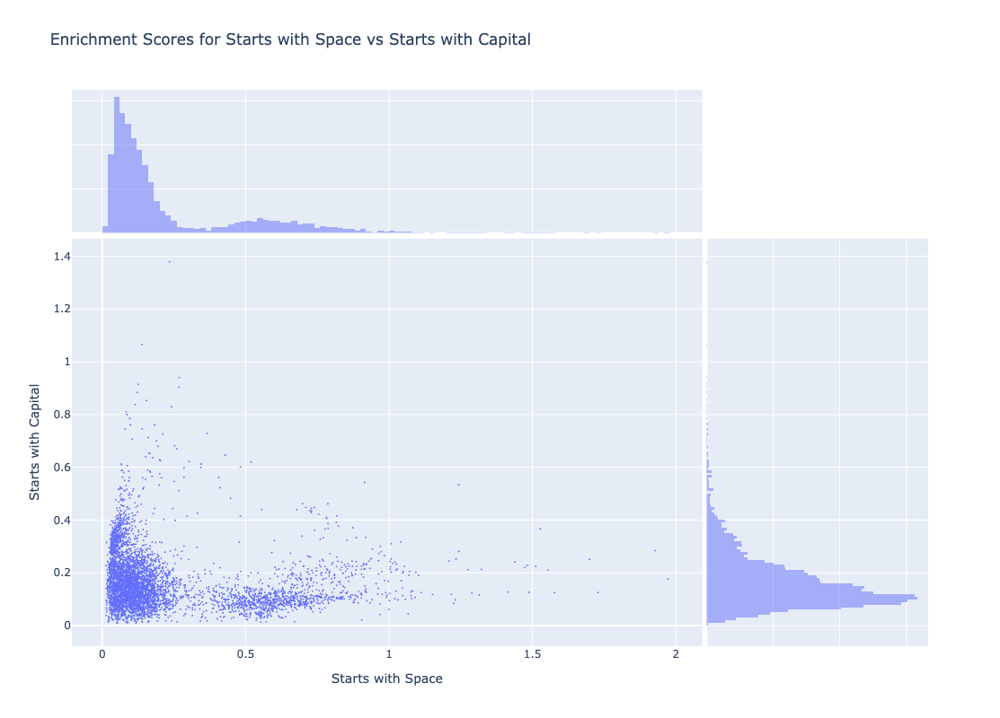

In [25]:
fig = px.scatter(
    df_enrichment_scores.apply(lambda x: -1 * np.log(1 - x)).T,
    x="starts_with_space",
    y="starts_with_capital",
    marginal_x="histogram",
    marginal_y="histogram",
    labels={
        "starts_with_space": "Starts with Space",
        "starts_with_capital": "Starts with Capital",
    },
    title="Enrichment Scores for Starts with Space vs Starts with Capital",
    height=800,
    width=800,
)
# reduce point size on the scatter only
fig.update_traces(marker=dict(size=2), selector=dict(mode="markers"))
fig.show()

In [26]:
token_sets_index = ["1 digit", "2 digits", "3 digits", "4 digits"]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores).show()

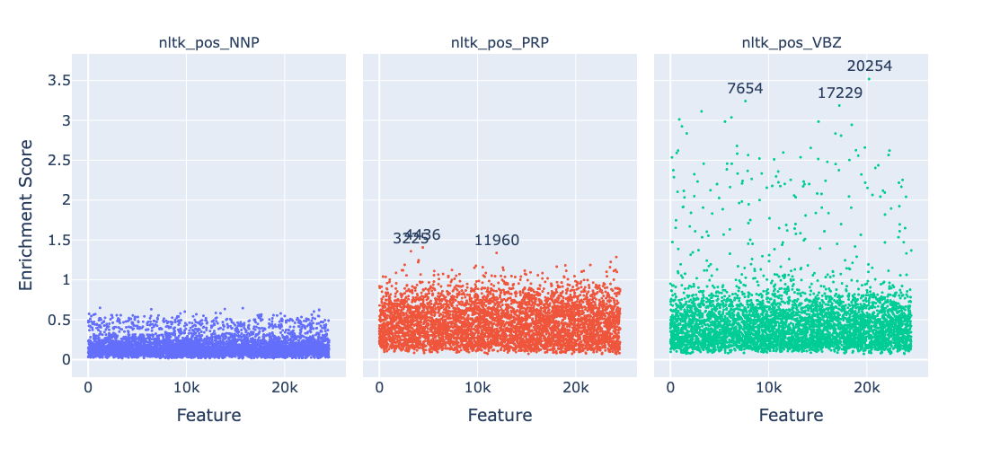

In [27]:
token_sets_index = ["nltk_pos_PRP", "nltk_pos_VBZ", "nltk_pos_NNP"]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores).show()

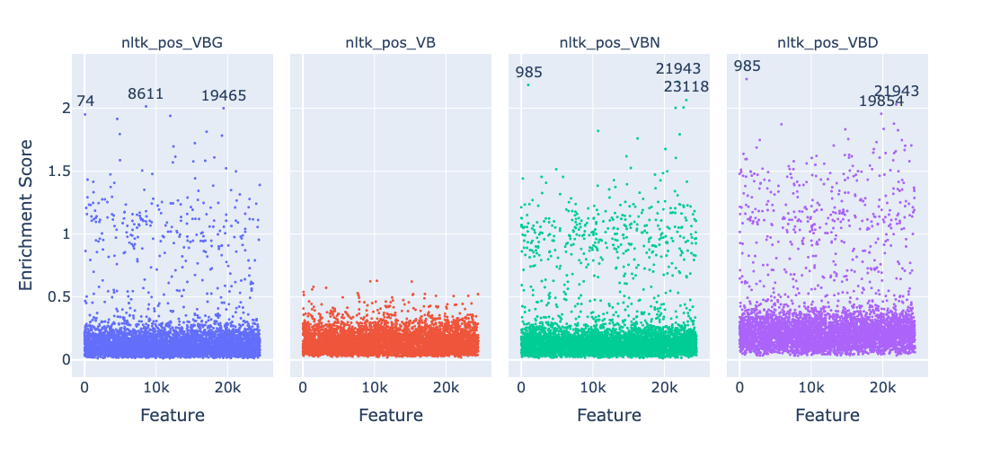

In [28]:
token_sets_index = ["nltk_pos_VBN", "nltk_pos_VBG", "nltk_pos_VB", "nltk_pos_VBD"]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores).show()

In [ ]:
token_sets_index = ["nltk_pos_WP", "nltk_pos_RBR", "nltk_pos_WDT", "nltk_pos_RB"]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores).show()

In [ ]:
token_sets_index = ["a", "e", "i", "o", "u"]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores).show()

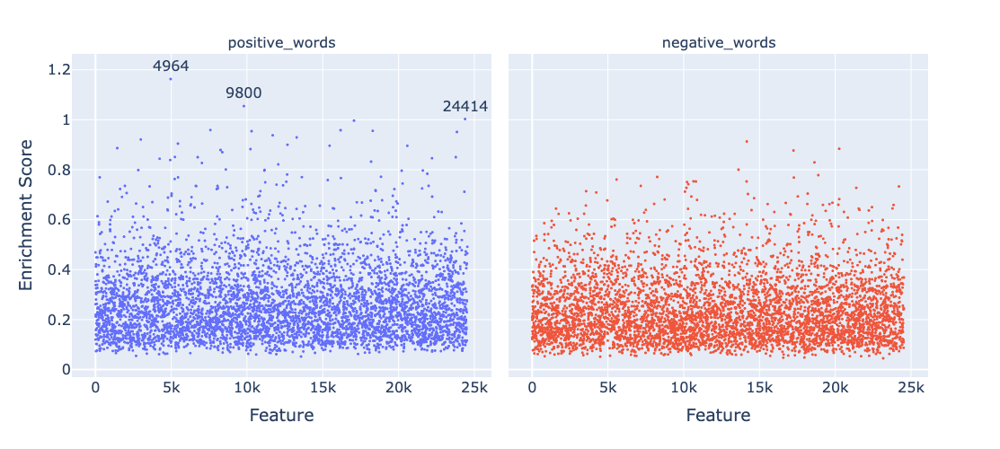

In [30]:
token_sets_index = ["negative_words", "positive_words"]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores).show()

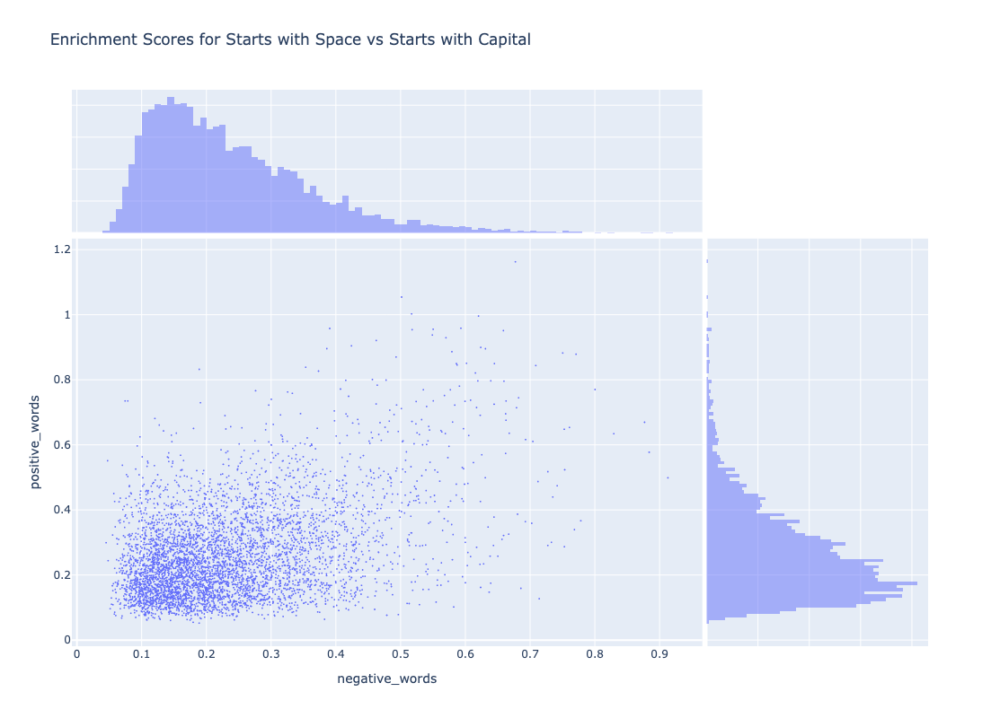

In [31]:
fig = px.scatter(
    df_enrichment_scores.apply(lambda x: -1 * np.log(1 - x))
    .T.reset_index()
    .rename(columns={"index": "feature"}),
    x="negative_words",
    y="positive_words",
    marginal_x="histogram",
    marginal_y="histogram",
    labels={
        "starts_with_space": "Starts with Space",
        "starts_with_capital": "Starts with Capital",
    },
    title="Enrichment Scores for Starts with Space vs Starts with Capital",
    height=800,
    width=800,
    hover_name="feature",
)
# reduce point size on the scatter only
fig.update_traces(marker=dict(size=2), selector=dict(mode="markers"))
fig.show()

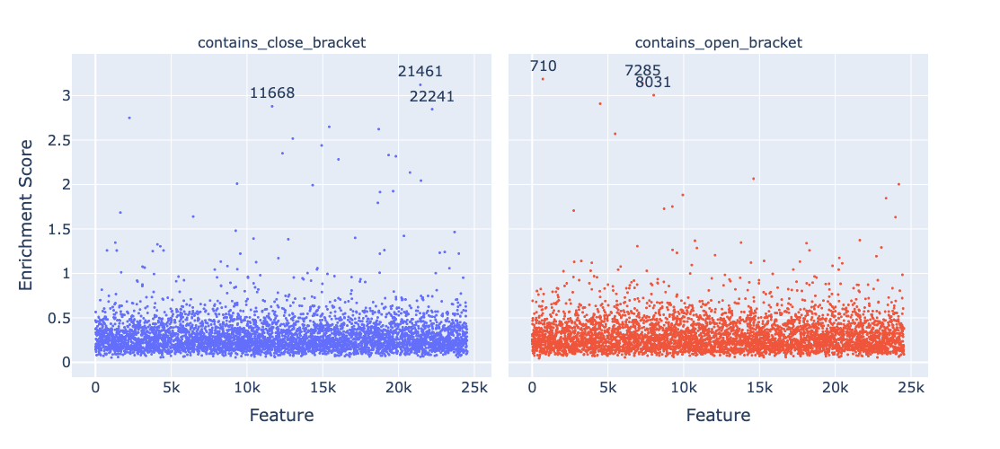

In [32]:
token_sets_index = ["contains_close_bracket", "contains_open_bracket"]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores).show()

In [ ]:
token_sets_index = [
    "1910's",
    "1920's",
    "1930's",
    "1940's",
    "1950's",
    "1960's",
    "1970's",
    "1980's",
    "1990's",
    "2000's",
    "2010's",
]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores).show()

In [ ]:
token_sets_index = ["positive_words", "negative_words"]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores, label_threshold=0.98).show()

In [ ]:
token_sets_index = ["boys_names", "girls_names"]
token_set_selected = {
    k: set(v) for k, v in all_token_sets.items() if k in token_sets_index
}
df_enrichment_scores = get_enrichment_df(
    dec_projection_onto_W_U, features_ordered_by_skew, token_set_selected
)
manhattan_plot_enrichment_scores(df_enrichment_scores).show()

In [ ]:
tmp_df = df_enrichment_scores.apply(lambda x: -1 * np.log(1 - x)).T
color = (
    W_U_stats_df_dec.sort_values("skewness", ascending=False)
    .head(5000)["skewness"]
    .values
)
fig = px.scatter(
    tmp_df.reset_index().rename(columns={"index": "feature"}),
    x="boys_names",
    y="girls_names",
    marginal_x="histogram",
    marginal_y="histogram",
    # color = color,
    labels={
        "boys_names": "Enrichment Score (Boys Names)",
        "girls_names": "Enrichment Score (Girls Names)",
    },
    height=600,
    width=800,
    hover_name="feature",
)
# reduce point size on the scatter only
fig.update_traces(marker=dict(size=3), selector=dict(mode="markers"))
# annotate any features where the absolute distance between boys names and girls names > 3
for feature in df_enrichment_scores.columns:
    if abs(tmp_df["boys_names"][feature] - tmp_df["girls_names"][feature]) > 2.9:
        fig.add_annotation(
            x=tmp_df["boys_names"][feature] - 0.4,
            y=tmp_df["girls_names"][feature] + 0.1,
            text=f"{feature}",
            showarrow=False,
        )


fig.show()

#### Digging into Particular Features

When we do these enrichments, I generate the logit weight histograms by category using the following function. It's important to make sure the categories you group by are in the columns of df_enrichment_scores.

In [ ]:
for category in ["boys_names"]:
    plot_top_k_feature_projections_by_token_and_category(
        token_set_selected,
        df_enrichment_scores,
        category=category,
        dec_projection_onto_W_U=dec_projection_onto_W_U,
        model=model,
        log_y=False,
        histnorm=None,
    )